# Manage unknown locations:

## Table of Contents
- ### [Introduction](#introduction)
- ### [Python libraries](#libraries)
- ### [Import raw data](#importData)
- ### [Data exploration](#dataexploration)
    - #### [Download importers data](#downloadImportersData)
    - #### [Retrieve geometries from importers data](#retrieveGeoms)
    - #### [Determine contry production and outsourcing](#countryProduction)
    - #### [Define weights](#weights)
- ### [Final notes](#finalNotes)

<a id='introduction'></a>
## Introduction

One of the 4 different locations type to explore is the unknow location. An unknow location is the one where we know the collection of that commodity but we don't have visibility of the origin of that commodity.

To solve this uncertanty we can do two different types of analysis:

1. A quick assumtion would be to consider that collection country as the origin country and therefore we would be using the centroid or the country admin area (potentially weighted by the location production of a particular commodity) to compute the metrics.

2. A slightly more elavorated approach would be to use the imports data from differnt locations to that collection country and generate a weighted map to compute the different metrics. THe import data information can be extracted from the following source: https://resourcetrade.earth/?year=2019&importer=152&category=90&units=value&autozoom=1

<a id='libraries'></a>
## Python libraries

In [64]:
import pandas as pd
import geopandas as gpd
import os
from IPython.display import Image
import requests
import folium
from processing.geolocating_data import GeolocateAddress

<a id='importData'></a>
## Import raw data

In [3]:
input_data = pd.read_csv('../raw_data/LG fake data sheet - Raw materials.csv')
input_data.head()

,Material,Material detail,Volume,Country,Address,Latitude,Longitude,Location type
0,Rubber,NaN,2400,China,NaN,NaN,NaN,Unknown
1,Rubber,NaN,1300,Malaysia,NaN,NaN,NaN,Unknown
2,Rubber,NaN,1000,United States,NaN,NaN,NaN,Unknown
3,Rubber,NaN,730,Japan,NaN,NaN,NaN,Unknown
4,Rubber,NaN,490,India,NaN,NaN,NaN,Unknown


In [6]:
## get unknown locations
unknown_data = input_data[input_data['Location type'] =='Unknown']
unknown_data.head()

,Material,Material detail,Volume,Country,Address,Latitude,Longitude,Location type
0,Rubber,NaN,2400,China,NaN,NaN,NaN,Unknown
1,Rubber,NaN,1300,Malaysia,NaN,NaN,NaN,Unknown
2,Rubber,NaN,1000,United States,NaN,NaN,NaN,Unknown
3,Rubber,NaN,730,Japan,NaN,NaN,NaN,Unknown
4,Rubber,NaN,490,India,NaN,NaN,NaN,Unknown


<a id='dataexploration'></a>
## Data exploration

In [9]:
## make a data exploration for one case
unknown_data_china = unknown_data[:1]
unknown_data_china

,Material,Material detail,Volume,Country,Address,Latitude,Longitude,Location type
0,Rubber,NaN,2400,China,NaN,NaN,NaN,Unknown


In [14]:
for i in range(0,len(unknown_data_china)):
    row = unknown_data_china.iloc[0]
    if row['Location type'] == 'Unknown':
        country = row['Country']
        commodity = row['Material']
        print(country, commodity)

China Rubber


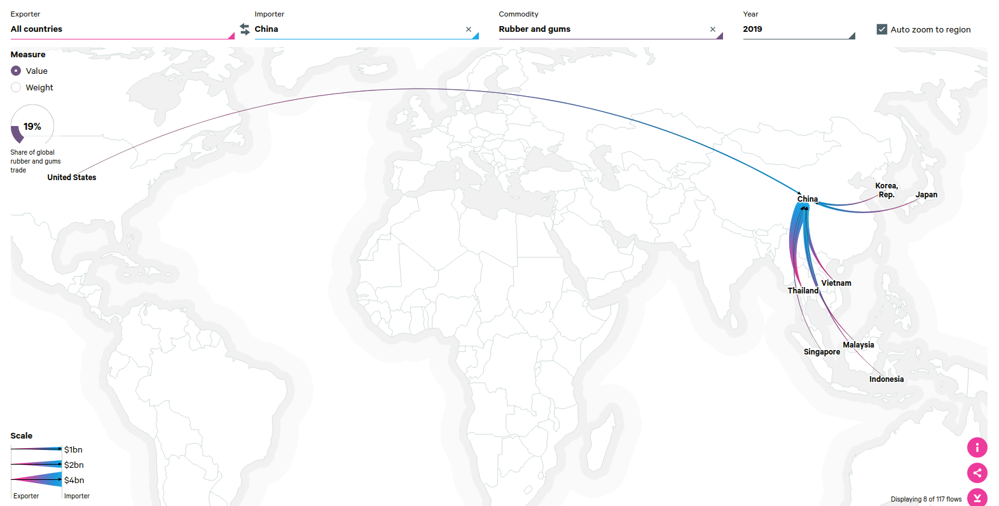

In [21]:
# image showing imports of rubber to chinna
Image(filename = "../raw_data/Screenshot from 2021-04-30 11-29-40.png", width = 900, height = 300)

<a id='downloadImportersData'></a>
### Download importers data

In [38]:
##get imports of rubber to china
## importer 156 is chinna
## category 17 is rubber
## TODO - get list of importers and categories

url = 'https://api.resourcetrade.earth/api/rt/2.3/downloads?year=2019&importer=156&category=17&units=value&autozoom=1'

df_imports = pd.read_excel (r'../raw_data/resourcetradeearth-all-156-17-2019.xlsx', sheet_name='Exporters')
df_imports

,Exporter M.49,Exporter ISO3,Exporter,Exporter region,Resource,Year,Value (1000USD),Weight (1000kg)
0,4,AFG,Afghanistan,Central and Southern Asia,Rubber and gums,2015,3637.358000,1175.469000
1,12,DZA,Algeria,Northern Africa and Western Asia,Rubber and gums,2015,0.021000,0.001000
2,31,AZE,Azerbaijan,Northern Africa and Western Asia,Rubber and gums,2015,1904.700000,120.111000
3,32,ARG,Argentina,Latin America and the Caribbean,Rubber and gums,2015,309.919454,121.880270
4,36,AUS,Australia,Australia and New Zealand,Rubber and gums,2015,8824.574757,2289.261924
...,...,...,...,...,...,...,...,...
565,842,USA,United States,Northern America,Rubber and gums,2019,353814.691650,138171.105565
566,854,BFA,Burkina Faso,Sub-Saharan Africa,Rubber and gums,2019,46.212000,83.742000
567,860,UZB,Uzbekistan,Central and Southern Asia,Rubber and gums,2019,22652.723000,5094.176300
568,894,ZMB,Zambia,Sub-Saharan Africa,Rubber and gums,2019,2.505000,0.005000


In [40]:
#do the analysis just for one year - year 2019
df_imports_2019 = df_imports[df_imports['Year']==2019]
df_imports_2019

,Exporter M.49,Exporter ISO3,Exporter,Exporter region,Resource,Year,Value (1000USD),Weight (1000kg)
452,31,AZE,Azerbaijan,Northern Africa and Western Asia,Rubber and gums,2019,768.550000,117.800000
453,32,ARG,Argentina,Latin America and the Caribbean,Rubber and gums,2019,231.075000,56.979000
454,36,AUS,Australia,Australia and New Zealand,Rubber and gums,2019,1706.255649,241.778480
455,40,AUT,Austria,Europe,Rubber and gums,2019,2647.636952,179.920651
456,50,BGD,Bangladesh,Central and Southern Asia,Rubber and gums,2019,1.160000,0.372000
...,...,...,...,...,...,...,...,...
565,842,USA,United States,Northern America,Rubber and gums,2019,353814.691650,138171.105565
566,854,BFA,Burkina Faso,Sub-Saharan Africa,Rubber and gums,2019,46.212000,83.742000
567,860,UZB,Uzbekistan,Central and Southern Asia,Rubber and gums,2019,22652.723000,5094.176300
568,894,ZMB,Zambia,Sub-Saharan Africa,Rubber and gums,2019,2.505000,0.005000


In [42]:
print(f'There are {len(df_imports_2019)} exporters  of rubber to chinna')

There are 118 exporters  of rubber to chinna


<a id='retrieveGeoms'></a>
### Retrieve geometries from importers data

In [48]:
#retrieve the geometries for each country 
geometry_list = []
for i in range(0, len(df_imports_2019)):
    row = df_imports_2019.iloc[i]
    country = row['Exporter']
    try:
        geolocation = GeolocateAddress(query=country)
        gdf = gpd.GeoDataFrame.from_features(geolocation.polygon_json, crs='epsg:4326')
        geom = gdf['geometry'].iloc[0]
    except:
        print(f'Geolocation for the location {country} has failed!')
        geom = 'None'
        
    geometry_list.append(geom)


Pausing 1 seconds before making HTTP GET request
Get https://nominatim.openstreetmap.org/search?format=json&limit=1&dedupe=0&q=Azerbaijan with timeout=180
Geocoded "Azerbaijan" to (47.7872508, 40.3936294)
Params:OrderedDict([('format', 'json'), ('limit', 1), ('dedupe', 0), ('polygon_geojson', 1), ('q', 'Azerbaijan')])
Preparing url: https://nominatim.openstreetmap.org/search?format=json&limit=1&dedupe=0&polygon_geojson=1&q=Azerbaijan
Pausing 1 seconds before making HTTP GET request
Get https://nominatim.openstreetmap.org/search?format=json&limit=1&dedupe=0&q=Argentina with timeout=180
Geocoded "Argentina" to (-64.9672817, -34.9964963)
Params:OrderedDict([('format', 'json'), ('limit', 1), ('dedupe', 0), ('polygon_geojson', 1), ('q', 'Argentina')])
Preparing url: https://nominatim.openstreetmap.org/search?format=json&limit=1&dedupe=0&polygon_geojson=1&q=Argentina
Pausing 1 seconds before making HTTP GET request
Get https://nominatim.openstreetmap.org/search?format=json&limit=1&dedupe=0&q

In [49]:
#append geometry to gdf
df_imports_2019['Geometry'] = geometry_list
df_imports_2019.head()

<ipython-input-49-aff9bc448e02>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imports_2019['Geometry'] = geometry_list


,Exporter M.49,Exporter ISO3,Exporter,Exporter region,Resource,Year,Value (1000USD),Weight (1000kg),Geometry
452,31,AZE,Azerbaijan,Northern Africa and Western Asia,Rubber and gums,2019,768.550000,117.800000,"(POLYGON ((44.7633701 39.7048253, 44.7635589 3..."
453,32,ARG,Argentina,Latin America and the Caribbean,Rubber and gums,2019,231.075000,56.979000,"(POLYGON ((-73.5605371 -49.9424656, -73.560483..."
454,36,AUS,Australia,Australia and New Zealand,Rubber and gums,2019,1706.255649,241.778480,"(POLYGON ((72.24619319999999 -53.020726, 72.24..."
455,40,AUT,Austria,Europe,Rubber and gums,2019,2647.636952,179.920651,"(POLYGON ((10.4544399 47.5557964, 10.454028 47..."
456,50,BGD,Bangladesh,Central and Southern Asia,Rubber and gums,2019,1.160000,0.372000,"(POLYGON ((88.007915 24.6678238, 88.0150592 24..."


In [57]:
df_imports_2019[df_imports_2019['Geometry']=='None']

,Exporter M.49,Exporter ISO3,Exporter,Exporter region,Resource,Year,Value (1000USD),Weight (1000kg),Geometry
519,490,NaN,"Other Asia, nes",NaN,Rubber and gums,2019,205365.910998,76504.797457,None
569,899,NaN,"Areas, nes",NaN,Rubber and gums,2019,28998.563000,6070.359000,None


In [60]:
#remove no valid geoms (the none)
df_imports_2019 = df_imports_2019[df_imports_2019['Geometry']!='None']
df_imports_2019.head()

,Exporter M.49,Exporter ISO3,Exporter,Exporter region,Resource,Year,Value (1000USD),Weight (1000kg),Geometry
452,31,AZE,Azerbaijan,Northern Africa and Western Asia,Rubber and gums,2019,768.550000,117.800000,"(POLYGON ((44.7633701 39.7048253, 44.7635589 3..."
453,32,ARG,Argentina,Latin America and the Caribbean,Rubber and gums,2019,231.075000,56.979000,"(POLYGON ((-73.5605371 -49.9424656, -73.560483..."
454,36,AUS,Australia,Australia and New Zealand,Rubber and gums,2019,1706.255649,241.778480,"(POLYGON ((72.24619319999999 -53.020726, 72.24..."
455,40,AUT,Austria,Europe,Rubber and gums,2019,2647.636952,179.920651,"(POLYGON ((10.4544399 47.5557964, 10.454028 47..."
456,50,BGD,Bangladesh,Central and Southern Asia,Rubber and gums,2019,1.160000,0.372000,"(POLYGON ((88.007915 24.6678238, 88.0150592 24..."


In [62]:
#set geometry to gdf
df_imports_2019 = df_imports_2019.set_geometry('Geometry')

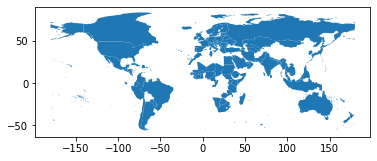

In [63]:

df_imports_2019.plot()

In [71]:
df_imports_2019 = df_imports_2019[['Exporter ISO3', 'Exporter','Resource', 'Year', 'Value (1000USD)', 'Weight (1000kg)', 'Geometry' ]]

In [73]:
#split geolocated data by polygon and points for saving
gdf_polygon = df_imports_2019[df_imports_2019['Geometry'].apply(lambda x : x.type!='Point' )]
gdf_point = df_imports_2019[df_imports_2019['Geometry'].apply(lambda x : x.type=='Point' )]

gdf_polygon.to_file(
    '../Processed_data/china_2019_rubber_imports_polygon.shp',
    driver='ESRI Shapefile',
)
gdf_point.to_file(
    '../Processed_data/china_2019_rubber_imports_point.shp',
    driver='ESRI Shapefile',
)

<ipython-input-73-f3ff2d21cc6f>:5: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_polygon.to_file(
<ipython-input-73-f3ff2d21cc6f>:9: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_point.to_file(


In [79]:
gdf_polygon.sort_values(
    'Value (1000USD)',
    ascending=False,
    inplace = True
)

In [85]:
top_exporters = gdf_polygon[0:7]
top_exporters

,Exporter ISO3,Exporter,Resource,Year,Value (1000USD),Weight (1000kg),Geometry
554,THA,Thailand,Rubber and gums,2019,3.778854e+06,2.449936e+06,"MULTIPOLYGON (((97.34381 18.57614, 97.34393 18..."
545,VNM,Vietnam,Rubber and gums,2019,1.556487e+06,1.154197e+06,"MULTIPOLYGON (((102.14403 22.40067, 102.14506 ..."
515,MYS,Malaysia,Rubber and gums,2019,1.128403e+06,7.870851e+05,"MULTIPOLYGON (((98.93721 5.68384, 98.93810 5.6..."
502,JPN,Japan,Rubber and gums,2019,6.738599e+05,2.034613e+05,"MULTIPOLYGON (((122.71418 24.44983, 122.71453 ..."
506,KOR,"Korea, Republic",Rubber and gums,2019,6.143445e+05,3.536981e+05,"MULTIPOLYGON (((124.37273 37.90986, 124.41105 ..."
496,IDN,Indonesia,Rubber and gums,2019,5.015793e+05,2.859830e+05,"POLYGON ((94.77171 5.79699, 94.78901 5.71208, ..."
565,USA,United States,Rubber and gums,2019,3.538147e+05,1.381711e+05,"MULTIPOLYGON (((-180.00000 51.79409, -179.9926..."


In [84]:
top_exporters = top_exporters.set_crs('epsg:4326')
m = folium.Map(location=[43.062776, -75.420884],tiles="cartodbpositron", zoom_start=7)
folium.GeoJson(data=top_exporters["Geometry"]).add_to(m) 
m

<a id='countryProduction'></a>
### Determine contry production and outsourcing

We can know the production registered by the FAO in 2019 of rubber in China (http://www.fao.org/faostat/en/#data/QC). The FAO also provides information for exports of rubber from China and imports from other countries (http://www.fao.org/faostat/en/#data/TP). With this information we can estimate the percentage of in country production vs the percentage of commodity imported from outsourcing.

In [99]:
Import_quantity = 560346
Export_quantity = 1716
production = 839909

In [104]:
Country_production_perct = (Export_quantity*100)/production
print(f'The country production is: {Country_production_perct} %')
print(f'The country import is: {100-Country_production_perct}%')
      

The country production is: 0.20430784763587484 %
The country import is: 99.79569215236413%


<a id='weights'></a>
### Define weights 

- TODO- extend this to incorporate the country production %

In [93]:
# total value in china for 2019 is 11377881.6251786
total_value_traders = sum(list(top_exporters['Value (1000USD)']))
print(f'The total value is: {total_value_traders}')

weight_list = []
for i in range(0, len(top_exporters)):
    row = top_exporters.iloc[i]
    value = row['Value (1000USD)']
    weight_value = value/ total_value_traders
    weight_list.append(weight_value)

The total value is: 8607342.907673586


In [95]:
#check that total weight is 1
sum(weight_list)

1.0

In [96]:
top_exporters['Weight_value'] = weight_list

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [97]:
top_exporters

,Exporter ISO3,Exporter,Resource,Year,Value (1000USD),Weight (1000kg),Geometry,Weight_value
554,THA,Thailand,Rubber and gums,2019,3.778854e+06,2.449936e+06,"MULTIPOLYGON (((97.34381 18.57614, 97.34393 18...",0.439027
545,VNM,Vietnam,Rubber and gums,2019,1.556487e+06,1.154197e+06,"MULTIPOLYGON (((102.14403 22.40067, 102.14506 ...",0.180833
515,MYS,Malaysia,Rubber and gums,2019,1.128403e+06,7.870851e+05,"MULTIPOLYGON (((98.93721 5.68384, 98.93810 5.6...",0.131098
502,JPN,Japan,Rubber and gums,2019,6.738599e+05,2.034613e+05,"MULTIPOLYGON (((122.71418 24.44983, 122.71453 ...",0.078289
506,KOR,"Korea, Republic",Rubber and gums,2019,6.143445e+05,3.536981e+05,"MULTIPOLYGON (((124.37273 37.90986, 124.41105 ...",0.071374
496,IDN,Indonesia,Rubber and gums,2019,5.015793e+05,2.859830e+05,"POLYGON ((94.77171 5.79699, 94.78901 5.71208, ...",0.058273
565,USA,United States,Rubber and gums,2019,3.538147e+05,1.381711e+05,"MULTIPOLYGON (((-180.00000 51.79409, -179.9926...",0.041106


In [98]:
top_exporters.to_file(
    '../Processed_data/china_2019_rubber_imports_topExprters.shp',
    driver='ESRI Shapefile',
)

<ipython-input-98-c0146da2a4e9>:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  top_exporters.to_file(


<a id='finalNotes'></a>
## Final notes

 - We could potentially short by value the different exporters ad just get the top 5 exporters of that commodity for the analysis - this can be combined to identify the Q90 or something like that?
 - should we short by value or by weight?
 - explore production in same country. We can use the production of the country listed by the FAO and the quantity exported from that country to determine the %of in country production and the % of imported commodity.
 
- todo - sort data by weight instead than by value

 